# Summary of Canopy Water Content Results - Comparing NEON & EMIT

In [1]:
# Import Packages
import os, sys #modules to create and acces file paths
import numpy as np #work with multi-dimensional arrays
import xarray as xr #work with labelled multi-dimenstional arrays
from osgeo import gdal #work with raster and vector geospatial data
import rasterio as rio #work with geospatial raster data
import rioxarray as rxr #work with raster arrays
from matplotlib import pyplot as plt #plotting data
import seaborn as sns
import hvplot.xarray #plot multi-dimensional arrays
import hvplot.pandas #plot DataFrames/Series
import pandas as pd #work with DataFrames
import geopandas as gpd #work with geospatial shapefiles

# Some cells may generate warnings that we can ignore; omment below lines to see the warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Define the file path for the modules directory
modules_dir = r"./modules"

# Create the data_dir if it doesn't already exist
if not os.path.exists(modules_dir):
    os.makedirs(modules_dir)
    print(f'modules directory made here: {modules_dir}')
else:
    print(f'modules directory already exists here: {modules_dir}')

modules directory already exists here: ./modules


In [3]:
# Import functions from the python scripts in the modules directory
from modules.emit_tools import emit_xarray # open EMIT datasets into xarray.Dataset
from modules.test_functions import surfrfl_hvplot_image

In [4]:
emit_cwc_dir = r'./cwc'
neon_cwc_dir = r'./cwc'

emit_burn_cwc_cog = os.path.join(emit_cwc_dir,'EMIT_L2A_RFL_001_20230731T205320_2321214_004_SOAP_298000_4100000_CWC_burned.tif')
emit_unburn_cwc_cog = os.path.join(emit_cwc_dir,'EMIT_L2A_RFL_001_20230731T205320_2321214_004_SOAP_298000_4101000_CWC_unburned.tif')

neon_burn_cwc_cog = os.path.join(neon_cwc_dir,'NEON_D17_SOAP_DP3_298000_4100000_CWC_burned.tif')
neon_unburn_cwc_cog = os.path.join(neon_cwc_dir,'NEON_D17_SOAP_DP3_298000_4101000_CWC_unburned.tif')

In [5]:
# Read in the EMIT Burned and Unburned CWC COGs
emit_burn_cwc_ds = rxr.open_rasterio(emit_burn_cwc_cog, band_as_variable=True)
emit_burn_cwc_ds = emit_burn_cwc_ds.rename_vars({"band_1": "cwc"})

emit_unburn_cwc_ds = rxr.open_rasterio(emit_unburn_cwc_cog, band_as_variable=True)
emit_unburn_cwc_ds = emit_unburn_cwc_ds.rename_vars({"band_1": "cwc"})

In [6]:
# Read in the NEON Burned and Unburned CWC COGs
neon_burn_cwc_ds = rxr.open_rasterio(neon_burn_cwc_cog, band_as_variable=True)
neon_burn_cwc_ds = neon_burn_cwc_ds.rename_vars({"band_1": "cwc"})

neon_unburn_cwc_ds = rxr.open_rasterio(neon_unburn_cwc_cog, band_as_variable=True)
neon_unburn_cwc_ds = neon_unburn_cwc_ds.rename_vars({"band_1": "cwc"})

In [7]:
neon_burn_cwc_ds.hvplot.image(x='x', y='y',
                              frame_height=405, frame_width=720,
                              fontscale=2,
                              cmap='jet_r',
                              clim = (0,0.5),
                              tiles='ESRI',
                              xlabel='Longitude',
                              ylabel='Latitude',
                              title='NEON CWC - SOAP Burned Tile',
                              crs='EPSG:4326')

:Overlay
   .WMTS.I  :WMTS   [Longitude,Latitude]
   .Image.I :Image   [x,y]   (Canopy Water Content)

In [8]:
import rioxarray as rxr
import xarray as xr

# --- Your existing code to read in the data ---
# Read in the EMIT Burned CWC COG (lower resolution)
emit_burn_cwc_ds = rxr.open_rasterio(emit_burn_cwc_cog, band_as_variable=True)
emit_burn_cwc_ds = emit_burn_cwc_ds.rename_vars({"band_1": "cwc"})

# Read in the NEON Burned CWC COG (higher resolution)
neon_burn_cwc_ds = rxr.open_rasterio(neon_burn_cwc_cog, band_as_variable=True)
neon_burn_cwc_ds = neon_burn_cwc_ds.rename_vars({"band_1": "cwc"})

# --- Resample and Calculate Difference ---

# 1. Spatially resample the NEON data to match the EMIT data's grid
# The .rio.reproject_match() method will handle both the Coordinate Reference System (CRS)
# and the resolution matching.
neon_burn_resampled = neon_burn_cwc_ds.rio.reproject_match(emit_burn_cwc_ds)

# 2. Calculate the difference
# This operation will subtract the resampled NEON dataset from the EMIT dataset.
burned_cwc_difference = emit_burn_cwc_ds - neon_burn_resampled

# Print the resulting dataset to inspect its properties
print(burned_cwc_difference)

# You can also save the difference raster to a file
burned_cwc_difference.rio.to_raster("burned_cwc_difference_resampled_neon.tif")

<xarray.Dataset> Size: 3kB
Dimensions:      (x: 22, y: 18)
Coordinates:
  * x            (x) float64 176B -119.3 -119.3 -119.3 ... -119.3 -119.3 -119.3
  * y            (y) float64 144B 37.03 37.03 37.03 37.03 ... 37.03 37.03 37.02
    spatial_ref  int64 8B 0
Data variables:
    cwc          (y, x) float64 3kB nan nan nan ... 9.999e+03 9.999e+03


In [14]:
import rioxarray as rxr
import xarray as xr

# --- Your existing code to read in the data ---
# Read in the EMIT Burned CWC COG (lower resolution)
emit_unburn_cwc_ds = rxr.open_rasterio(emit_unburn_cwc_cog, band_as_variable=True)
emit_unburn_cwc_ds = emit_unburn_cwc_ds.rename_vars({"band_1": "cwc"})

# Read in the NEON Burned CWC COG (higher resolution)
neon_unburn_cwc_ds = rxr.open_rasterio(neon_unburn_cwc_cog, band_as_variable=True)
neon_unburn_cwc_ds = neon_unburn_cwc_ds.rename_vars({"band_1": "cwc"})

# --- Resample and Calculate Difference ---

# 1. Spatially resample the NEON data to match the EMIT data's grid
# The .rio.reproject_match() method will handle both the Coordinate Reference System (CRS)
# and the resolution matching.
neon_unburn_resampled = neon_unburn_cwc_ds.rio.reproject_match(emit_unburn_cwc_ds)

# 2. Calculate the difference
# This operation will subtract the resampled NEON dataset from the EMIT dataset.
unburned_cwc_difference = emit_unburn_cwc_ds - neon_unburn_resampled

# Print the resulting dataset to inspect its properties
print(unburned_cwc_difference)

# You can also save the difference raster to a file
unburned_cwc_difference.rio.to_raster("unburned_cwc_difference_resampled_neon.tif")

<xarray.Dataset> Size: 4kB
Dimensions:      (x: 23, y: 18)
Coordinates:
  * x            (x) float64 184B -119.3 -119.3 -119.3 ... -119.3 -119.3 -119.3
  * y            (y) float64 144B 37.04 37.04 37.04 37.04 ... 37.03 37.03 37.03
    spatial_ref  int64 8B 0
Data variables:
    cwc          (y, x) float64 3kB 9.999e+03 9.999e+03 9.999e+03 ... nan nan


In [10]:
# Print basic information about the DataArray
print(burned_cwc_difference['cwc'])

# Print key statistics
print("\nData Statistics:")
print(f"Minimum value: {burned_cwc_difference['cwc'].min().values}")
print(f"Maximum value: {burned_cwc_difference['cwc'].max().values}")
print(f"Mean value: {burned_cwc_difference['cwc'].mean().values}")

# Count non-NaN and NaN values
num_valid_pixels = burned_cwc_difference['cwc'].count().values
num_nan_pixels = burned_cwc_difference['cwc'].isnull().sum().values
total_pixels = burned_cwc_difference['cwc'].size

print(f"Number of valid pixels: {num_valid_pixels} out of {total_pixels}")
print(f"Number of NaN pixels: {num_nan_pixels} out of {total_pixels}")

<xarray.DataArray 'cwc' (y: 18, x: 22)> Size: 3kB
array([[            nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan,             nan,             nan,
                    nan,             nan,             nan,
         9.99902800e+03,  9.99900614e+03,  9.99911763e+03,
         9.99903425e+03,  9.99910330e+03,  9.99902208e+03,
         9.99912199e+03,  9.99915686e+03,  9.99915686e+03,
         9.99902801e+03],
       [-2.15030038e-02, -1.61173393e-01, -3.88202169e-02,
        -1.89492067e-01, -1.63415224e-01, -4.81347319e-02,
         2.70407962e-02, -1.93534458e-02, -2.26113848e-02,
        -1.90943624e-01, -9.04622716e-02, -1.52388502e-01,
         3.65060833e-04, -5.99186065e-02, -3.34034260e-02,
        -1.35155550e-01, -1.89904961e-01, -1.03346072e-01,
        -2.13220943e-03, -2.11748993e-01,  1.11423405e-02,
         9.99901114e+03],
       [ 9.99902350e+03, -8.48555772e-02, -1.39949057e-01,
         3.37

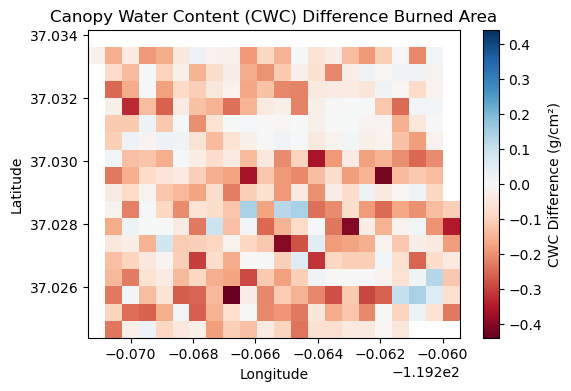

In [13]:
import matplotlib.pyplot as plt
import numpy as np # We'll need this for np.nan

# Create a copy of the data to avoid modifying the original
clean_burn_cwc_difference = burned_cwc_difference['cwc'].copy()

# Replace the 'nodata' outlier value with NaN
# We'll use a threshold (e.g., > 1000) to safely capture the outlier
clean_burn_cwc_difference = clean_burn_cwc_difference.where(clean_burn_cwc_difference < 1000, np.nan)

# Create a figure and axes for the plot
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

# Plot the cleaned difference raster.
# The plot function will now automatically use a more appropriate color scale.
clean_burn_cwc_difference.plot(ax=ax, cmap='RdBu', center=0, cbar_kwargs={'label': 'CWC Difference (g/cm²)'})

# Add a title and axis labels
ax.set_title('Canopy Water Content (CWC) Difference Burned Area')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Display the plot
plt.show()

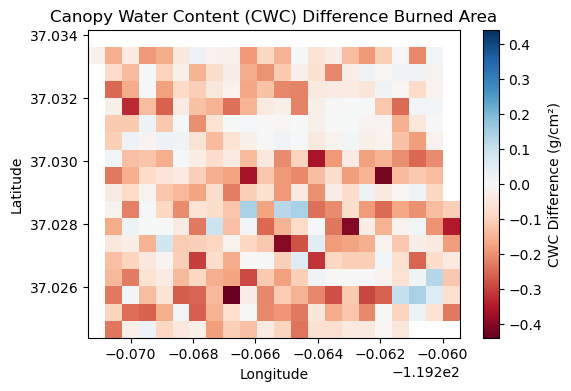

In [13]:
import matplotlib.pyplot as plt
import numpy as np # We'll need this for np.nan

# Create a copy of the data to avoid modifying the original
clean_burn_cwc_difference = burned_cwc_difference['cwc'].copy()

# Replace the 'nodata' outlier value with NaN
# We'll use a threshold (e.g., > 1000) to safely capture the outlier
clean_burn_cwc_difference = clean_burn_cwc_difference.where(clean_burn_cwc_difference < 1000, np.nan)

# Create a figure and axes for the plot
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

# Plot the cleaned difference raster.
# The plot function will now automatically use a more appropriate color scale.
clean_burn_cwc_difference.plot(ax=ax, cmap='RdBu', center=0, cbar_kwargs={'label': 'CWC Difference (g/cm²)'})

# Add a title and axis labels
ax.set_title('Canopy Water Content (CWC) Difference Burned Area')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Display the plot
plt.show()

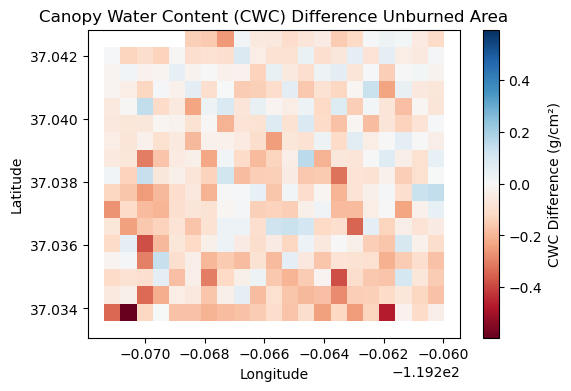

In [15]:
import matplotlib.pyplot as plt
import numpy as np # We'll need this for np.nan

# Create a copy of the data to avoid modifying the original
clean_unburn_cwc_difference = unburned_cwc_difference['cwc'].copy()

# Replace the 'nodata' outlier value with NaN
# We'll use a threshold (e.g., > 1000) to safely capture the outlier
clean_unburn_cwc_difference = clean_unburn_cwc_difference.where(clean_unburn_cwc_difference < 1000, np.nan)

# Create a figure and axes for the plot
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

# Plot the cleaned difference raster.
# The plot function will now automatically use a more appropriate color scale.
clean_unburn_cwc_difference.plot(ax=ax, cmap='RdBu', center=0, cbar_kwargs={'label': 'CWC Difference (g/cm²)'})

# Add a title and axis labels
ax.set_title('Canopy Water Content (CWC) Difference Unburned Area')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Display the plot
plt.show()

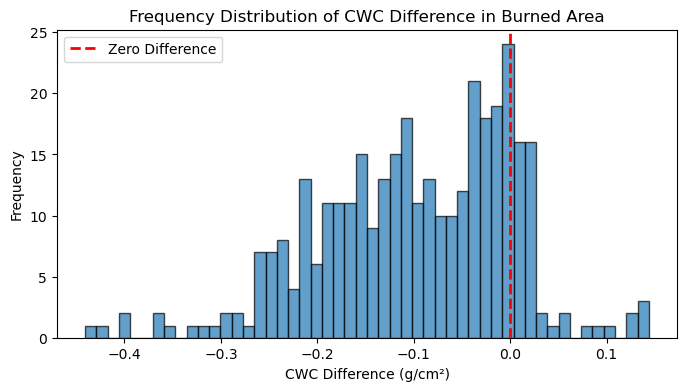

In [17]:
import matplotlib.pyplot as plt

# Create a figure and axes for the histogram
fig, ax = plt.subplots(figsize=(8, 4))

# Plot the histogram.
# We use .values to access the underlying numpy array, and .flatten()
# to ensure the 2D raster data is treated as a 1D array of values.
# The 'bins' parameter controls the number of bars in the histogram.
ax.hist(clean_burn_cwc_difference.values.flatten(), bins=50, edgecolor='black', alpha=0.7)

# Add a vertical line at zero to show the neutral difference
ax.axvline(0, color='red', linestyle='dashed', linewidth=2, label='Zero Difference')

# Add a title and axis labels
ax.set_title('Frequency Distribution of CWC Difference in Burned Area')
ax.set_xlabel('CWC Difference (g/cm²)')
ax.set_ylabel('Frequency')

# Add a legend to explain the vertical line
ax.legend()

# Display the plot
plt.show()

In [18]:
import numpy as np
from scipy import stats

# Assuming 'cleaned_cwc_difference' is the xarray.DataArray
# with the outlier value replaced by NaN.

# 1. Prepare the data for the t-test.
# We need to extract the values, convert them to a 1D array, and
# remove any NaN values, as the t-test function cannot handle them.
# The `dropna()` method is perfect for this.
difference_values = clean_burn_cwc_difference.values.flatten()
difference_values = difference_values[~np.isnan(difference_values)]

# Check the number of samples to ensure we have enough data
num_samples = len(difference_values)
print(f"Number of valid samples for t-test: {num_samples}")

if num_samples > 1:
    # 2. Perform the one-sample t-test
    # popmean=0 is the value we are testing against (zero difference)
    t_statistic, p_value = stats.ttest_1samp(difference_values, popmean=0)

    # 3. Print and interpret the results
    print("\nOne-Sample T-Test Results:")
    print(f"T-statistic: {t_statistic:.4f}")
    print(f"P-value: {p_value:.4f}")

    # Interpret the p-value
    alpha = 0.05
    print("\nInterpretation:")
    if p_value < alpha:
        print("The p-value is less than the significance level (alpha=0.05).")
        print("We reject the null hypothesis. The mean difference is statistically significant from zero.")
    else:
        print("The p-value is greater than or equal to the significance level (alpha=0.05).")
        print("We fail to reject the null hypothesis. The mean difference is not statistically significant from zero.")

else:
    print("Not enough samples to perform a t-test.")

Number of valid samples for t-test: 346

One-Sample T-Test Results:
T-statistic: -18.2145
P-value: 0.0000

Interpretation:
The p-value is less than the significance level (alpha=0.05).
We reject the null hypothesis. The mean difference is statistically significant from zero.


In [20]:
# Assuming 'cleaned_cwc_difference' is the xarray.DataArray
# with the outlier value replaced by NaN.

# Calculate the mean of the cleaned difference data
# The .values[()] extracts the numerical value from the xarray object
mean_difference = clean_unburn_cwc_difference.mean().values[()]

# Print the result
print(f"The mean Canopy Water Content (CWC) difference is: {mean_difference:.4f} g/cm²")

The mean Canopy Water Content (CWC) difference is: -0.0805 g/cm²


In [21]:
# Assuming 'cleaned_cwc_difference' is the xarray.DataArray
# with the outlier value replaced by NaN.

# Calculate the mean of the cleaned difference data
# The .values[()] extracts the numerical value from the xarray object
mean_difference = clean_burn_cwc_difference.mean().values[()]

# Print the result
print(f"The mean Canopy Water Content (CWC) difference is: {mean_difference:.4f} g/cm²")

The mean Canopy Water Content (CWC) difference is: -0.0986 g/cm²
